# Table of Contents:
[I. Examine and Explore data](#I.-Examine-and-Explore-data)<br>
[1.1 Prepare data](#1.1-Prepare-data)<br>
[1.2 Visualization](#1.2-Visualization)<br>
[1.3 Manipulate data](#1.3-Manipulate-data)<br>

[II. Build Model](#II.-Build-Model)

[III. Evaluation](#III.-Evaluation)

[IV. Conclusions](#IV.-Conclusions)

# I. Examine and Explore data

## 1.1 Prepare data

In [1]:
import os
import pandas as pd
import numpy
import SimpleITK as sitk
import numpy as np
import glob
import csv
import os
from sklearn.model_selection import train_test_split
import seaborn as sns
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import pyplot, cm
import warnings
warnings.filterwarnings('ignore')

Lấy tên đường dẫn của các file thêm vào một list

In [2]:
PathDicom = "D:\CBD robotics course\data\subset0\subset0"
lstFilesDCM = [] 
for dirName, subdirList, fileList in os.walk(PathDicom):
    for filename in fileList:
        if ".mhd" in filename.lower():
            lstFilesDCM.append(os.path.join(dirName,filename))

In [3]:
len(lstFilesDCM)

89

Trong subset0 này có 89 hình chụp CT<br>
Kiểm tra lại thử tên đường dẫn có đúng không:

In [65]:
lstFilesDCM[0]

'D:\\CBD robotics course\\data\\subset0\\subset0\\1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.mhd'

Load file csv chứa dữ liệu của bênh nhân

In [3]:
candidates = pd.read_csv('D:\CBD robotics course\data\candidates_V2.csv')

## 1.2 Visualization
Ta sẽ muốn xem thử hình này hiển thị ra sao. Đầu tiên chuyển các hình về dạng array

In [4]:
def load_itk_image(filename):
    itkimage = sitk.ReadImage(filename)
    numpyImage = sitk.GetArrayFromImage(itkimage)
    return numpyImage
numpyImage = load_itk_image(lstFilesDCM[0])
print (numpyImage.shape)

(121, 512, 512)


<BarContainer object of 89 artists>

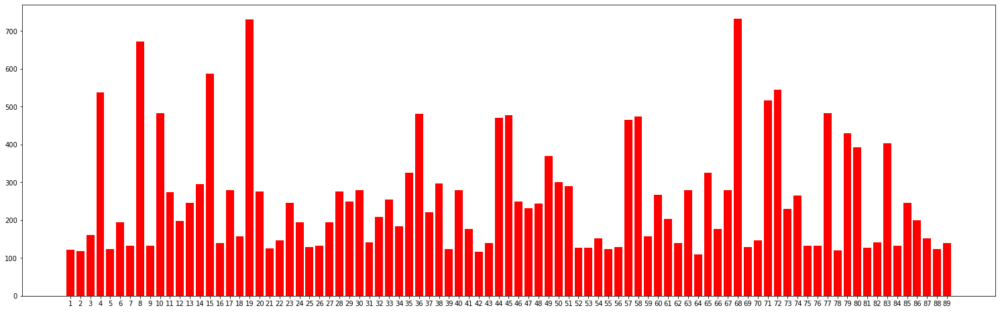

In [7]:
count_total={}
for i in range(0,89,1):
    count_total[str(i+1)]=load_itk_image(lstFilesDCM[i]).shape[0]
plt.figure(figsize=(26,8))
plt.bar(count_total.keys(), count_total.values(),  color='r')

In [8]:
load_itk_image(lstFilesDCM[0]).shape[0]

121

In [9]:
load_itk_image(lstFilesDCM[2])[0].shape

(512, 512)

89 hình này có shape đầu tiên khác nhau vì đây là hình chụp CT nên nó có thực ra nó có nhiều hình chồng lên nhau. Ta vẽ thử hình đầu tiên xem sao.

121


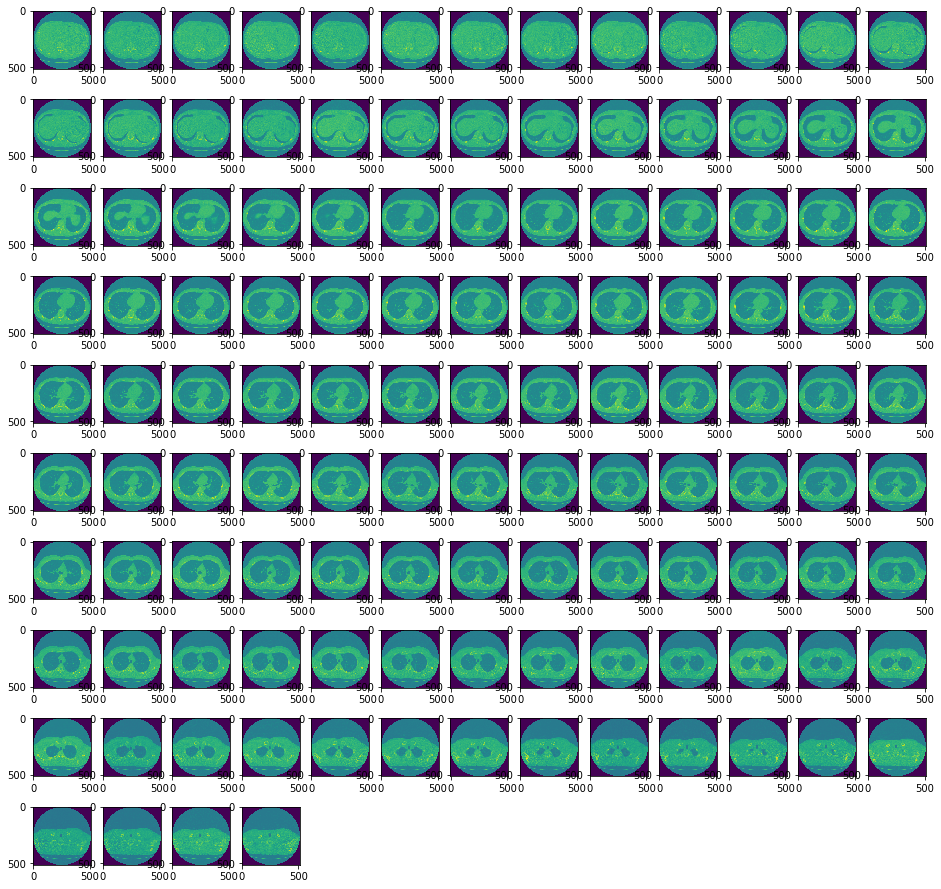

In [10]:
import math
def plot_mhd_file(file):
    Img = sitk.ReadImage(file) 
    arrImg = sitk.GetArrayFromImage(Img)
    n_images = arrImg.shape[0]
    print(n_images)
    ncol = 13
    nrow = math.ceil(n_images / ncol)
    plt.figure(figsize=(16, 16))
    for i in range(arrImg.shape[0]): # shape
        plt.subplot(nrow, ncol, i + 1)
        plt.imshow(arrImg[i])
plot_mhd_file(lstFilesDCM[0])        

Vậy hình đâu tiên có kết cấu từ 121 hình.

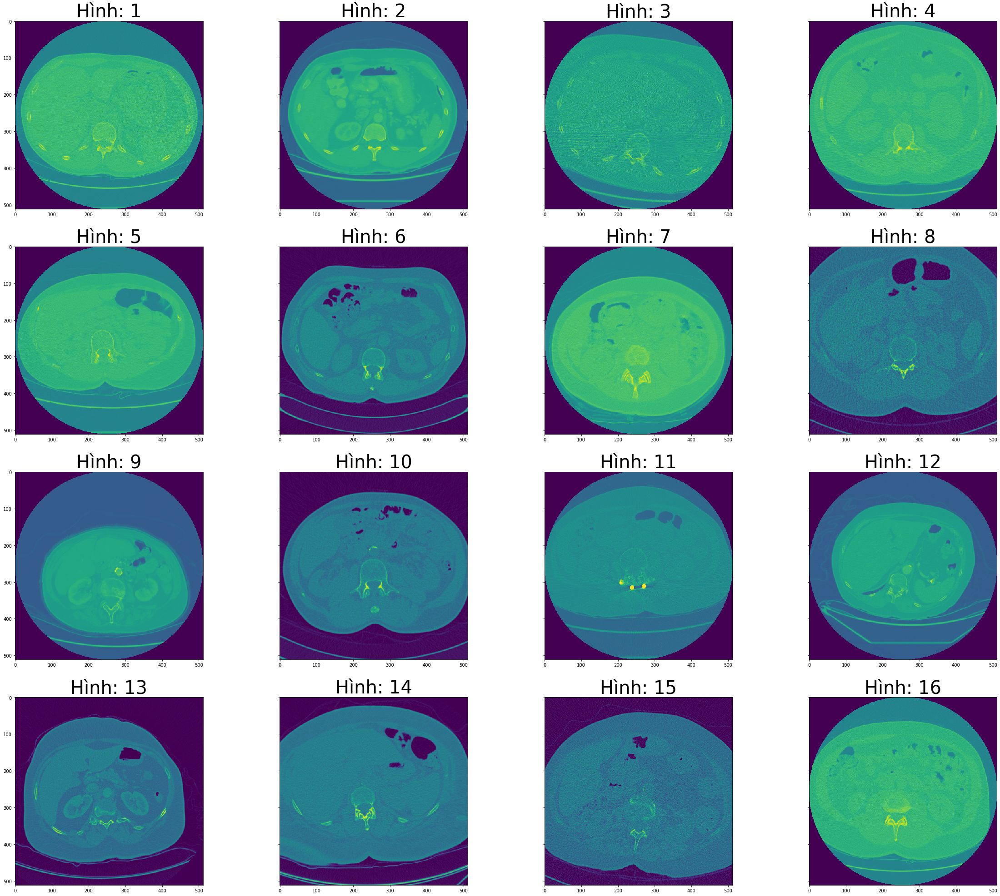

In [11]:
fig, axs = plt.subplots(4,4, figsize=(40, 35), sharey='row')
axs = axs.ravel()
for i in range(0,16,1):
    axs[i].imshow(load_itk_image(lstFilesDCM[i])[0])
    axs[i].set_title('Hình: '+str(i+1),fontsize=40)
plt.show()

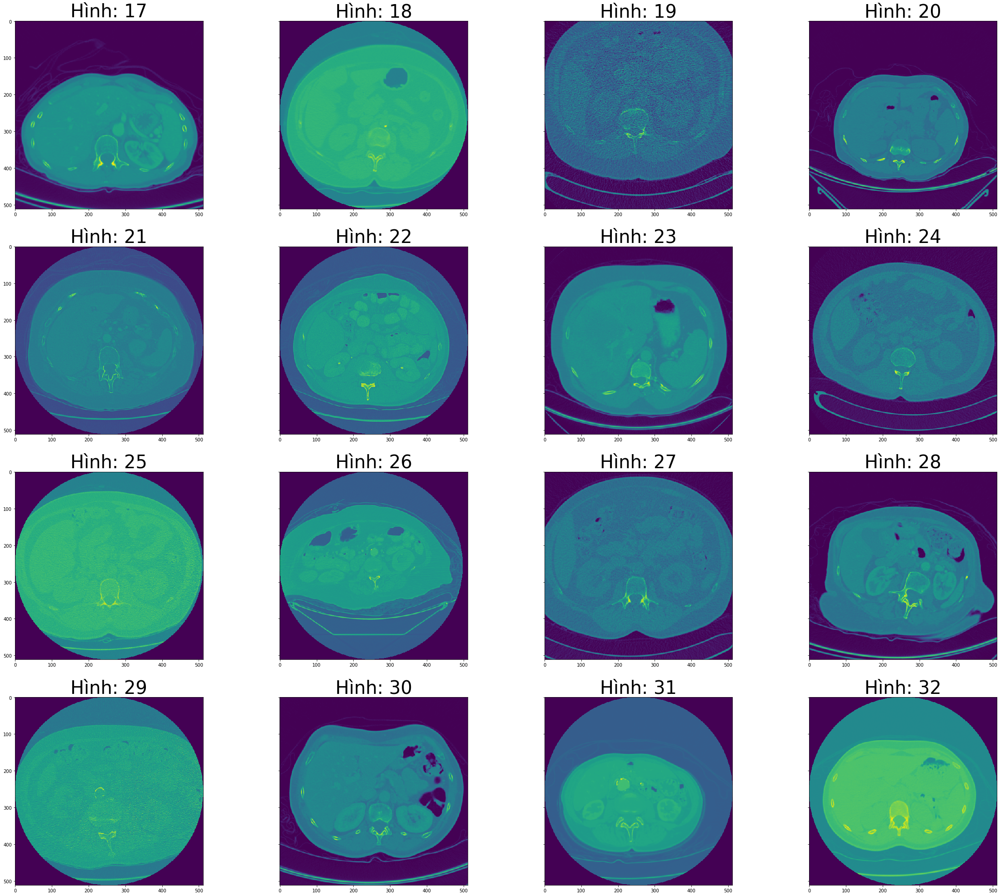

In [12]:
fig, axs = plt.subplots(4,4, figsize=(40, 35), sharey='row')
axs = axs.ravel()
for index, i in enumerate(range(16,32,1)):
    axs[index].imshow(load_itk_image(lstFilesDCM[i])[0])
    axs[index].set_title('Hình: '+str(i+1),fontsize=40)
plt.show()

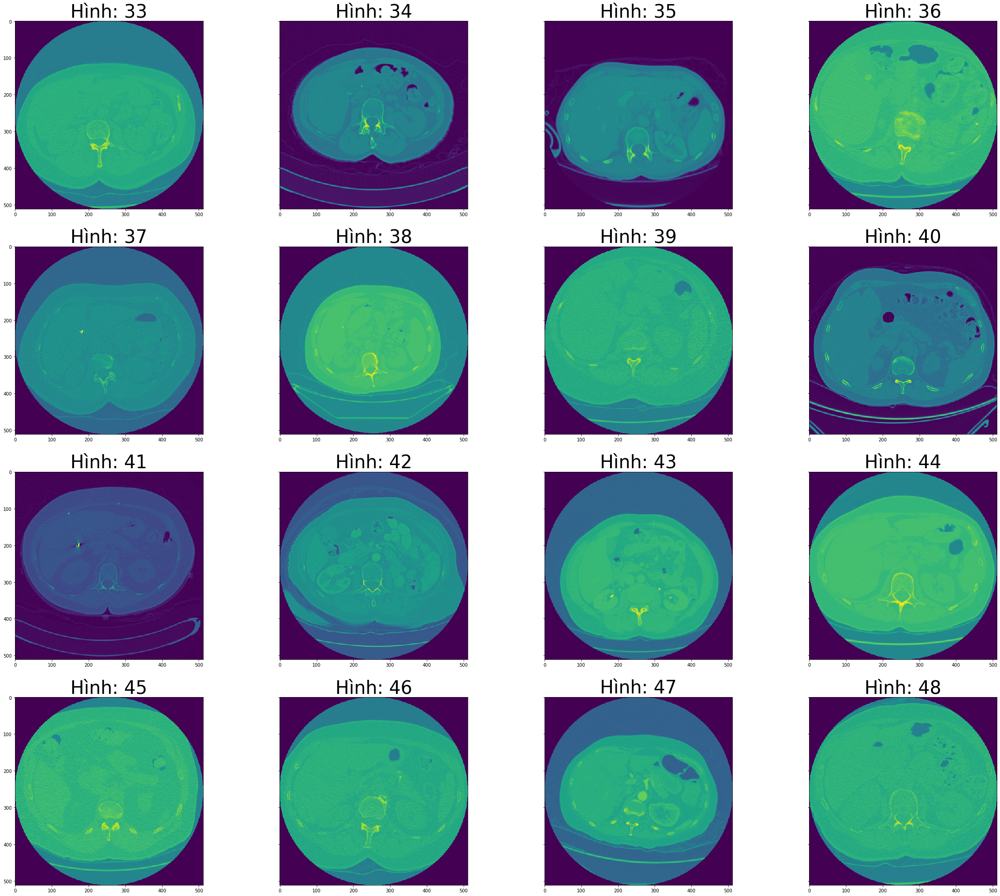

In [14]:
fig, axs = plt.subplots(4,4, figsize=(40, 35), sharey='row')
axs = axs.ravel()
for index, i in enumerate(range(32,48,1)):
    axs[index].imshow(load_itk_image(lstFilesDCM[i])[0])
    axs[index].set_title('Hình: '+str(i+1),fontsize=40)
plt.show()

**Minh họa bằng hình động của hình đầu tiên**

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


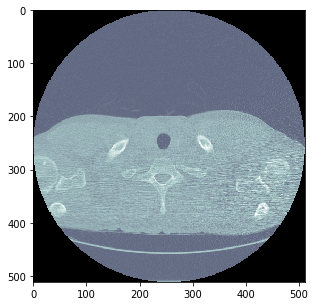

In [15]:
import matplotlib.animation as animation
def animate():
    fig =  plt.figure(figsize=(8,5))
    anim = plt.imshow(load_itk_image(lstFilesDCM[0])[0], cmap=plt.cm.bone)
    def update(i):
        anim.set_array(load_itk_image(lstFilesDCM[0])[i])
        return anim
    a= animation.FuncAnimation(fig, update, frames=np.arange(0, 121), interval=121)
    a.save('test.gif', writer='imagemagick', fps=15)
animate()
def display_gif(fn):
    from IPython import display
    return display.HTML('<img src="{}">'.format(fn))
display_gif('test.gif')

## 1.3 Manipulate data

**Chỉnh lại dữ liệu cho file csv candidate**<br>
Vì tài nguyên có hạn nên không thể tải hết dữ liệu, file csv candidate chứa đầy đủ thông tin của dữ liệu nên phải lọc ra 1 file mới.

In [13]:
lstFilesDCM[0]

'D:\\CBD robotics course\\data\\subset0\\subset0\\1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.mhd'

In [14]:
load_itk_image(lstFilesDCM[0]).shape[0]

121

In [3]:
candidates.head()

,seriesuid,coordX,coordY,coordZ,class
0,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,68.420000,-74.480000,-288.700000,0
1,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-95.209361,-91.809406,-377.426350,0
2,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-24.766755,-120.379294,-273.361539,0
3,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-63.080000,-65.740000,-344.240000,0
4,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,52.946688,-92.688873,-241.067872,0


In [30]:
candidates.groupby('seriesuid').agg({'class': pd.Series.nunique}).head()

,class
seriesuid,
1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222365663678666836860,2
1.3.6.1.4.1.14519.5.2.1.6279.6001.100332161840553388986847034053,1
1.3.6.1.4.1.14519.5.2.1.6279.6001.100398138793540579077826395208,2
1.3.6.1.4.1.14519.5.2.1.6279.6001.100530488926682752765845212286,1
1.3.6.1.4.1.14519.5.2.1.6279.6001.100620385482151095585000946543,1


In [20]:
len(candidates)

551065

In [21]:
candidates['class'].value_counts()

0    549714
1      1351
Name: class, dtype: int64

File này chứa dữ liệu của **551065** hình (tính cả hình đã được xếp chồng lên của hình chụp CT)<br>
Trong đó **549714** hình người không bị ung thư và **1351** là của người bị ung thư<br>
Kết luận dữ liệu (tổng) này là imbalance

**Tạo ra file csv mới chứa dữ liệu sẽ dùng**

In [22]:
datasub0 = candidates[0:0]
datasub0

,seriesuid,coordX,coordY,coordZ,class


In [23]:
lstFilesDCM[0]

'D:\\CBD robotics course\\data\\subset0\\subset0\\1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.mhd'

In [24]:
candidates.seriesuid[0]

'1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222365663678666836860'

Ý tưởng: là sẽ dò từng phần tử trong cột **seriesuid** của file candidates, nếu trùng tên thì sẽ add dòng đó vào dataframe datasub0

In [25]:
for i in range(candidates.shape[0]):
    if ('D:\CBD robotics course\data\subset0\subset0\\'+ candidates.seriesuid[i]+'.mhd' in lstFilesDCM):
        datasub0 = datasub0.append(candidates.loc[i])

In [26]:
datasub0.head()

,seriesuid,coordX,coordY,coordZ,class
9310,1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031...,129.568151,45.377097,-277.835758,0
9311,1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031...,-97.260000,56.360000,-201.930000,0
9312,1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031...,99.230491,-4.882165,-128.691305,0
9313,1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031...,-15.287525,-59.105100,-251.303750,0
9314,1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031...,109.344666,1.891737,-237.284699,0


In [27]:
datasub0.shape

(56938, 5)

Dữ liệu mới giờ chỉ còn thông tin của **56938** hình. Giờ ta lưu file csv mới. Để có thể dùng lần sau.

In [ ]:
datasub0.to_csv('newdata.csv')

In [5]:
datasub0 = pd.read_csv('newdata.csv')

In [9]:
len(datasub0['seriesuid'].unique())

89

In [10]:
datasub0.groupby('seriesuid').agg({'class': pd.Series.nunique}).head()

,class
seriesuid,
1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260,1
1.3.6.1.4.1.14519.5.2.1.6279.6001.108197895896446896160048741492,2
1.3.6.1.4.1.14519.5.2.1.6279.6001.109002525524522225658609808059,2
1.3.6.1.4.1.14519.5.2.1.6279.6001.111172165674661221381920536987,2
1.3.6.1.4.1.14519.5.2.1.6279.6001.122763913896761494371822656720,1


In [12]:
n= datasub0.groupby('seriesuid').agg({'class': pd.Series.nunique})
len(n[n['class']== 2])

66

Trong 89 hình chúng ta có có 66 hình có cùng lúc 2 nhãn.<br>
Ta cần viết một đoạn script để đánh lại nhãn. Với những hình nào có 2 nhãn thì đánh là nhãn 1, hình nào 1 nhãn thì giữ nguyên.

In [6]:
n= datasub0['seriesuid'].unique()

In [7]:
uid = []
label = []
for i in n:
    uid.append(i)
    if len(datasub0[(datasub0['seriesuid']== i) & (datasub0['class'] == 1)]) >0 and len(datasub0[(datasub0['seriesuid']== i) & (datasub0['class'] == 0)])>0:
        label.append(1)
    else:
        if len(datasub0[(datasub0['seriesuid']== i) & (datasub0['class'] == 0)]) == 0:
            label.append(1)
        else:
            label.append(0)

In [56]:
len(uid)

89

In [8]:
print(label)

[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]


In [61]:
n = 0
for i in label:
    if i == 1:
        n+=1
round(n/len(label)*100, 2)

74.16

In [8]:
Image = [load_itk_image(i) for i in  lstFilesDCM]

In [92]:
type(Image)

list

In [77]:
Image[0].shape[0]

121

In [9]:
lst_array_img = []
lst_label = []
for index,img in enumerate(Image):
    for i in img:
        lst_array_img.append(i)
    for i in range(img.shape[0]):
        lst_label.append(label[index])    

In [12]:
len(lst_array_img)

22870

In [13]:
len(lst_label)

22870

In [10]:
X = np.array(lst_array_img)
y= np.array(lst_label)

In [11]:
X.shape

(22870, 512, 512)

**Lưu dữ liệu lại để tiện cho việc chỉnh sửa mô hình và load lại**

**Save**

In [13]:
np.save('input_X',X)

In [12]:
np.save('output_y', y)

**Load**

In [14]:
X = np.load('input_X.npy')
y = np.load('output_y.npy')

In [15]:
X.shape

(22870, 512, 512)

**Resize lại input vì cỡ hình 512x 512 quá lớn, mà tài nguyên lại hạn chế**

In [16]:
import cv2
X_128 = []
for i in X:
    X_128.append(cv2.resize(i, dsize=(128, 128), interpolation=cv2.INTER_CUBIC))

In [17]:
X_128 = np.array(X_128)
np.save('input_X_128',X_128)

In [3]:
X = np.load('input_X_128.npy')
y = np.load('output_y.npy')

**One hot encode y ( vì y có nhãn 0 và 1) và ta định sử dụng CNN để tạo mô hình**

In [5]:
X.shape

(22870, 128, 128)

In [4]:
y.shape

(22870,)

In [6]:
df = pd.DataFrame({'label':y})
y_enc = pd.get_dummies(df, columns=['label'])
y_enc.head()

,label_0,label_1
0,1,0
1,1,0
2,1,0
3,1,0
4,1,0


**Hold out: Chia Train và Test**

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_enc, test_size=0.2, random_state=42)

In [8]:
X_train.shape

(18296, 128, 128)

In [9]:
X_test.shape

(4574, 128, 128)

Reshape để X_train và X_test, vì mô hình nhận đầu vào 4 chiều

In [10]:
X_train = X_train.reshape(X_train.shape[0], 128, 128, 1)
X_test = X_test.reshape(X_test.shape[0], 128, 128, 1)

In [63]:
# hoặc dùng cách này
X_train = np.expand_dims(X_train, axis=3)
X_test = np.expand_dims(X_test, axis=3)

# II. Build Model

In [15]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.optimizers import SGD
from keras.constraints import maxnorm
from keras import backend as K
from IPython.display import display

In [71]:
#from keras.optimizers import Adam
#adam = Adam(lr= 1e-5)

In [19]:
def base_model():
    # create model
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape = (128,128,1), padding='same', use_bias=False))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Conv2D(32, (3, 3), use_bias=False))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size = (2, 2)))
    model.add(Conv2D(32, (3, 3), padding='same', use_bias=False))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Conv2D(32, (3, 3), use_bias=False))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size = (2, 2)))
    model.add(Flatten())
    model.add(Dense(units = 256, kernel_initializer='he_normal', use_bias=False))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Dropout(0.25))
    model.add(Dense(units = 2, activation = 'softmax', kernel_initializer='he_normal'))
    # compile model
    model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    return model
model = base_model()
print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 128, 128, 32)      288       
_________________________________________________________________
batch_normalization_13 (Batc (None, 128, 128, 32)      128       
_________________________________________________________________
activation_13 (Activation)   (None, 128, 128, 32)      0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 126, 126, 32)      9216      
_________________________________________________________________
batch_normalization_14 (Batc (None, 126, 126, 32)      128       
_________________________________________________________________
activation_14 (Activation)   (None, 126, 126, 32)      0         
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 63, 63, 32)        0         
__________

In [20]:
model.fit(X_train, y_train,
          batch_size=64, nb_epoch=10,
          verbose=1,
          validation_data=(X_test, y_test))

Instructions for updating:
Use tf.cast instead.
Train on 18296 samples, validate on 4574 samples
Epoch 1/10
18296/18296 [==============================] - 38s 2ms/step - loss: 0.1158 - acc: 0.9604 - val_loss: 0.0056 - val_acc: 0.9996
Epoch 2/10
18296/18296 [==============================] - 32s 2ms/step - loss: 0.0018 - acc: 0.9999 - val_loss: 4.1235e-04 - val_acc: 1.0000
Epoch 3/10
18296/18296 [==============================] - 32s 2ms/step - loss: 2.9929e-04 - acc: 1.0000 - val_loss: 1.1930e-04 - val_acc: 1.0000
Epoch 4/10
18296/18296 [==============================] - 32s 2ms/step - loss: 0.0081 - acc: 0.9971 - val_loss: 4.9098 - val_acc: 0.3959
Epoch 5/10
18296/18296 [==============================] - 32s 2ms/step - loss: 0.0118 - acc: 0.9969 - val_loss: 0.0015 - val_acc: 0.9996
Epoch 6/10
18296/18296 [==============================] - 32s 2ms/step - loss: 4.8784e-04 - acc: 1.0000 - val_loss: 1.3381e-04 - val_acc: 1.0000
Epoch 7/10
18296/18296 [==============================] - 32s

In [22]:
model.save('D:/CBD robotics course/Assignment/Assignment 10/trained_model.h5')

In [30]:
from keras.models import load_model
model = load_model('D:/CBD robotics course/Assignment/Assignment 10/trained_model.h5')

# III. Evaluation

In [33]:
score = model.evaluate(X_test, y_test, batch_size=32, verbose=0)
print('Accuracy: %.2f%%' % (score[1]*100))

Accuracy: 100.00%


In [34]:
from sklearn.metrics import classification_report
predicted_y = model.predict(X_test)

In [47]:
y_array= y_test.to_numpy()

In [48]:
y_pred = [np.argmax(i) for i in predicted_y]
y_true = [np.argmax(i) for i in y_array]
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       942
           1       1.00      1.00      1.00      3632

    accuracy                           1.00      4574
   macro avg       1.00      1.00      1.00      4574
weighted avg       1.00      1.00      1.00      4574



# IV. Conclusions

- Khi làm việc với dữ liệu lớn, tài nguyên hạn chế, ta có thể dùng một số mẹo như set ram ảo [link](https://phongvu.vn/hoi-dap/cach-set-ram-ao-giup-may-tinh-tron-tru-hon)
- Với những dữ liệu có sẵn được cung cấp từ bên ngoài, ta cần phải đọc mô tả dữ liệu để biết được kích thước- độ lớn, cũng như các loại dữ liệu nào cần sử dụng.
- Trong quá trình tiền xử lý dữ liệu, việc resize lại kích cỡ cho bé đi cũng tức đồng nghĩa với việc một phần dữ liệu đã bị mất đi.
- Sau khi có được dữ liệu đầu vào và đầu ra. Nên lưu lại để trữ trong máy nội tại qua (np.save hoặc pickle)
- Khi việc tune mô hình (tăng epoch ,làm mô hình bự lên, làm mô hình sâu hơn, chỉnh lại learning rate,..) không có hiệu quả (như loss tập val không giảm) thì đây là lúc thay đổi hẳn cấu trúc của mô hình. 